# Automating the analysis process

## Requirements

Insgesamt brauchen wir 4 Typen für alle Parametertypen:
- Zeitverlauf des Code KLs in Abhängigkeit von p3 (für alle Parameter Kombinationen)
- Zeitverlauf der Dissimilarity in Abhängigkeit von p3 (für alle Parameter Kombinationen)
- Nicht so wichtig: Zeitverlauf der Varianz in Abhängigkeit von p3 (für alle Parameter Kombinationen)
- Code KL in Abhängigkeit von p1, p2, p3 (für verschiedene pML und num_ML Kombinationen)

## Configuration & imports

In [44]:
import base64
from io import BytesIO

import pandas as pd
import numpy as np
from itertools import product
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (15,9)
plt.rcParams["figure.dpi"] = 100

In [2]:
!ls data

alt_ml_agg_20200401-084836.csv
alt_ml_agg_20200401-085720.csv
alt_ml_ts_20200401-084836.csv
alt_ml_ts_20200401-085720.csv
basic_ml_agg_20200310-142229.csv
basic_ml_agg_20200310-145004.csv
basic_ml_agg_20200310-155223.csv
basic_ml_agg_20200311-051322.csv
basic_ml_agg_20200313-142558.csv
basic_ml_agg_20200313-143226.csv
basic_ml_agg_20200313-152217.csv
basic_ml_agg_20200403-065929.csv
basic_ml_raw_20200310-142229.csv
basic_ml_raw_20200310-145004.csv
basic_ml_raw_20200310-155223.csv
basic_ml_raw_20200311-051322.csv
basic_ml_ts_20200310-142229.csv
basic_ml_ts_20200310-145004.csv
basic_ml_ts_20200310-155223.csv
basic_ml_ts_20200311-051322.csv
basic_ml_ts_20200313-142558.csv
basic_ml_ts_20200313-143226.csv
basic_ml_ts_20200313-152217.csv
basic_ml_ts_20200403-065929.csv
ext_ml_agg_20200331-075248.csv
ext_ml_ts_20200331-075248.csv
human_kl_ts_(num_ml_()_(p_ml_n)_(p_1_u)_(p_2_m).svg
human_kl_ts_num_ml_(_p_ml_n_p_1_u_p_2_m.svg
robust_ml_agg_20200402-130730.csv
robust_ml_agg_20200402-133257.csv
r

## Time series plots

In [3]:
ts = pd.read_csv("data/basic_ml_ts_20200403-065929.csv")
ts.shape

(42768, 17)

In [4]:
ts.head(10).transpose()

,0,1,2,3,4,5,6,7,8,9
config,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
step,0.0000,1.0000,2.0000,3.0000,4.0000,5.0000,6.0000,7.0000,8.0000,9.0000
belief_dims,30.0000,30.0000,30.0000,30.0000,30.0000,30.0000,30.0000,30.0000,30.0000,30.0000
num_humans,50.0000,50.0000,50.0000,50.0000,50.0000,50.0000,50.0000,50.0000,50.0000,50.0000
num_ml,5.0000,5.0000,5.0000,5.0000,5.0000,5.0000,5.0000,5.0000,5.0000,5.0000
p_1,0.1000,0.1000,0.1000,0.1000,0.1000,0.1000,0.1000,0.1000,0.1000,0.1000
p_2,0.1000,0.1000,0.1000,0.1000,0.1000,0.1000,0.1000,0.1000,0.1000,0.1000
p_3,0.1000,0.1000,0.1000,0.1000,0.1000,0.1000,0.1000,0.1000,0.1000,0.1000
p_h1,0.1000,0.1000,0.1000,0.1000,0.1000,0.1000,0.1000,0.1000,0.1000,0.1000
p_h2,0.5000,0.5000,0.5000,0.5000,0.5000,0.5000,0.5000,0.5000,0.5000,0.5000


In [55]:
def p2str(prob):
    return str(prob).replace('.', '')

def plot_time_series(ts, 
                     dep_var='code_kl', 
                     query_vars=['num_ml', 'p_ml', 'p_1', 'p_2'],
                     x_var='step',
                     plot_var='p_3',
                     fname='test',
                     save_path='data/'):
    queries = []
    
    for var in query_vars:
        queries.append(pd.unique(ts[var]))
        
    html = f"""
    <h1>Time series analysis for {dep_var}</h1>
    """
    for query_vals in product(*queries):
        query = ' & '.join([f'({q[0]} == {q[1]})' for q in zip(query_vars, query_vals)])
        configs = np.unique(ts.query(query)['config'].values)
        df = ts.loc[ts['config'].isin(configs)]
        kls = df.groupby([plot_var, x_var]).mean()[dep_var]
        for p in kls.index.unique(level=0):
            plt.plot(kls.loc[p].index, kls.loc[p], label=f"{plot_var}={p}")
        plt.title(', '.join([f'{q[0]}={q[1]}' for q in zip(query_vars, query_vals)]))
        plt.legend()
        plt.xlabel(f'{x_var}')
        plt.ylabel(f'avg({dep_var})')
        tmpfile = BytesIO()
        plt.savefig(tmpfile, format='png')
        plt.show()
        encoded = base64.b64encode(tmpfile.getvalue()).decode('utf-8')
        html += f"<h2>Configuration: {', '.join([f'{q[0]}={q[1]}' for q in zip(query_vars, query_vals)])}</h2>"
        html += f"<img src=\'data:image/png;base64,{encoded}\'>"
    with open(f'{save_path}{fname}_{dep_var}.html','w') as f:
        f.write(html)
    return

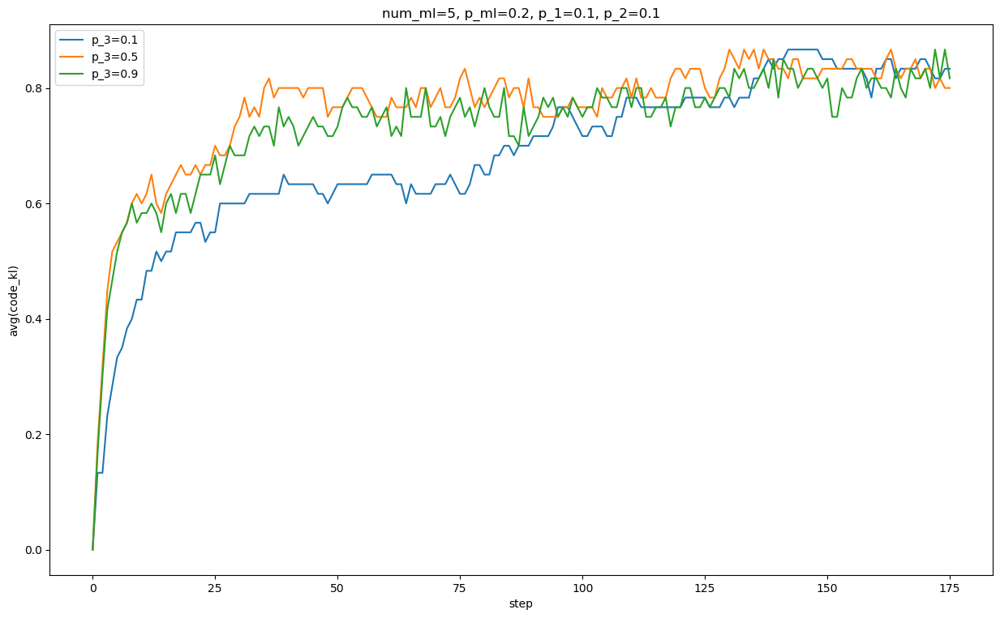

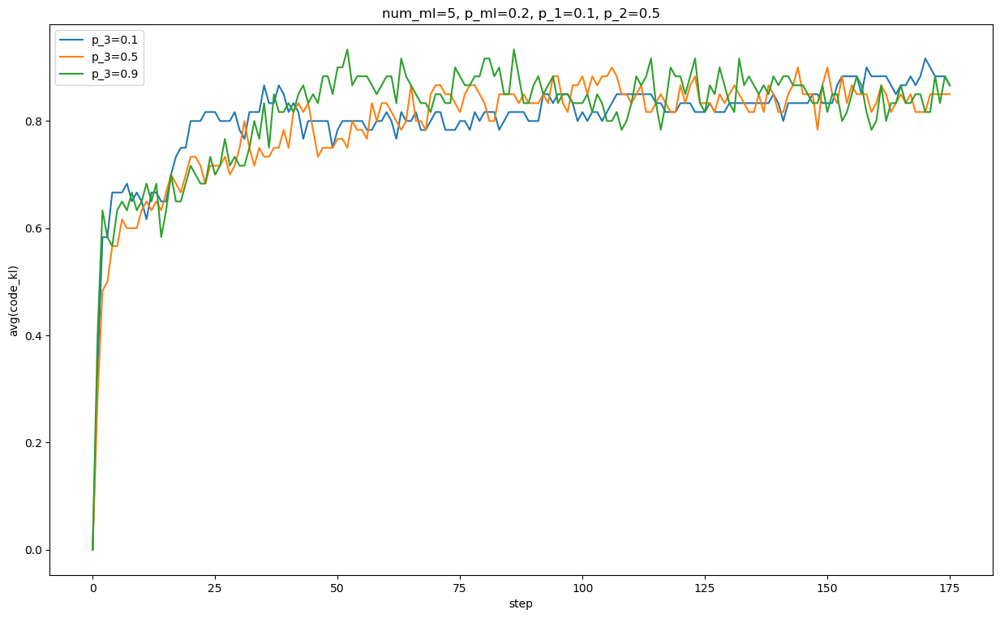

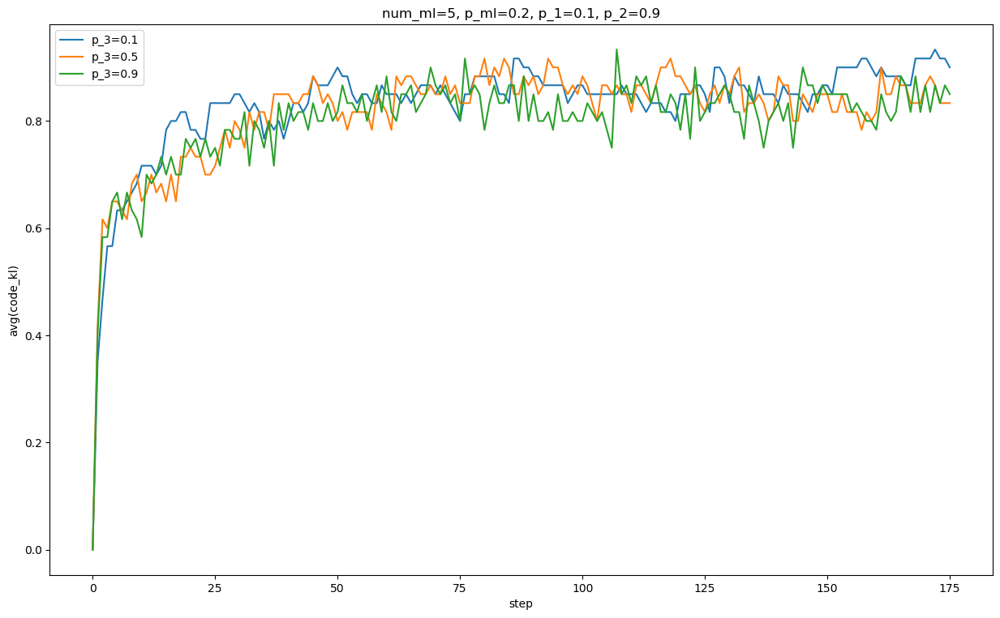

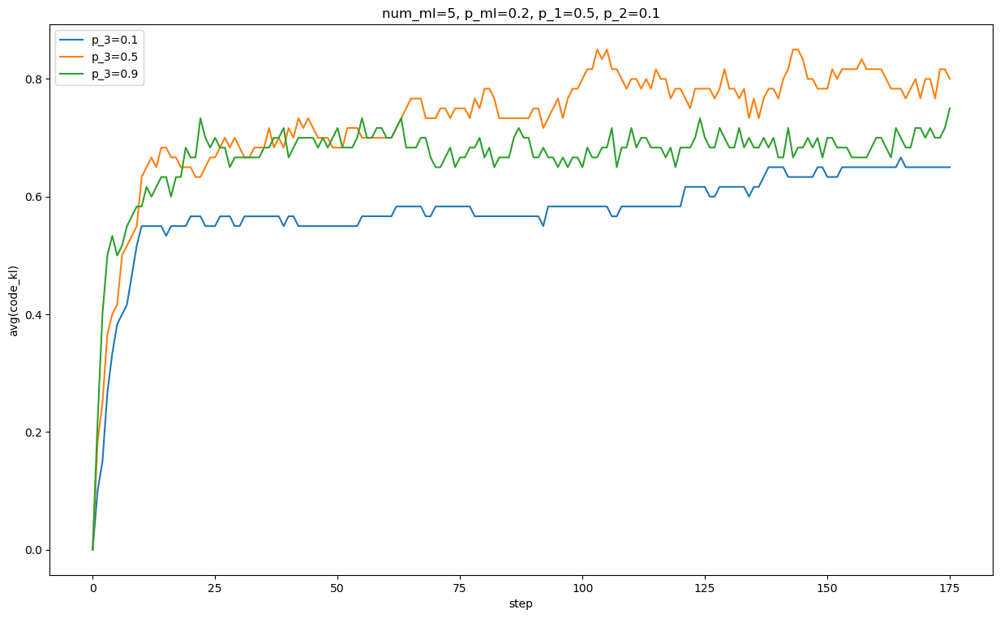

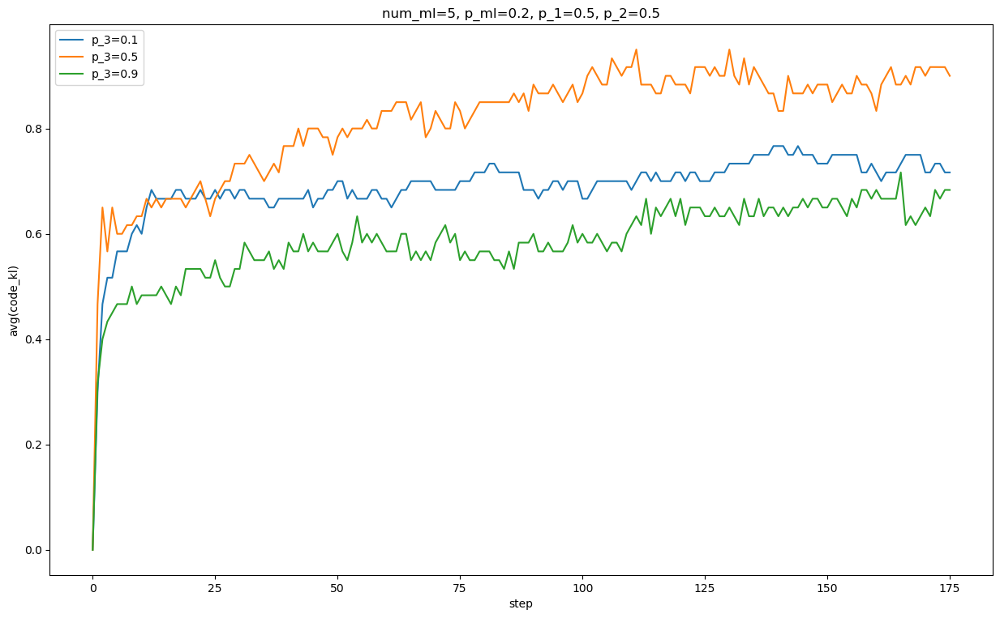

...

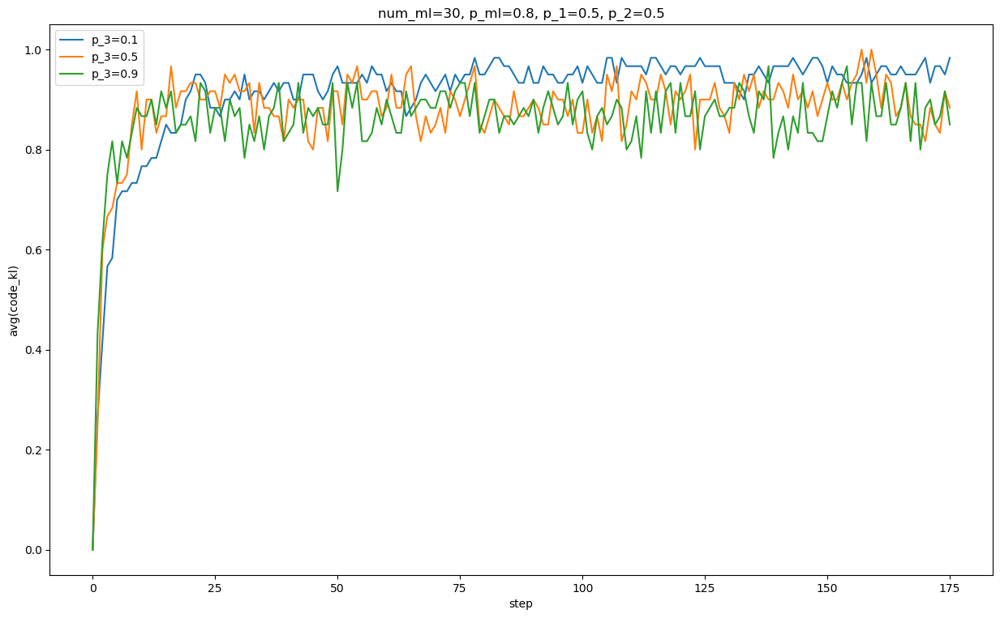

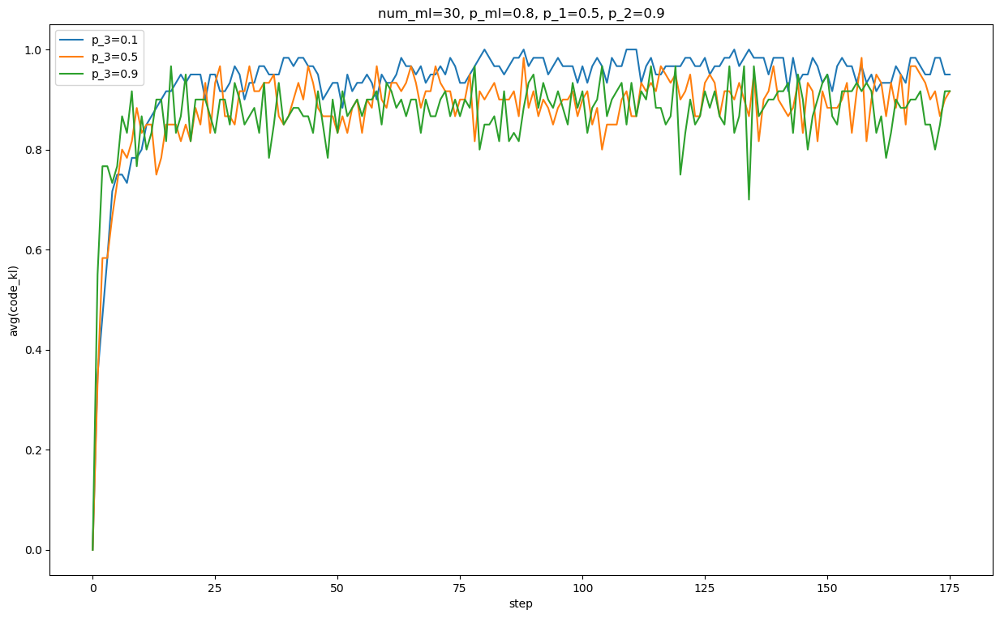

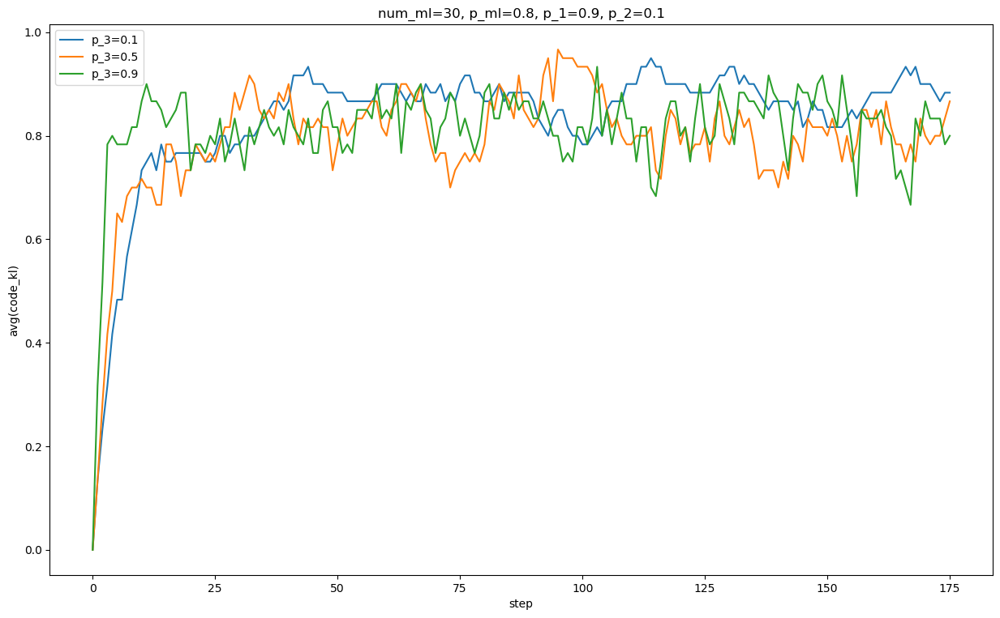

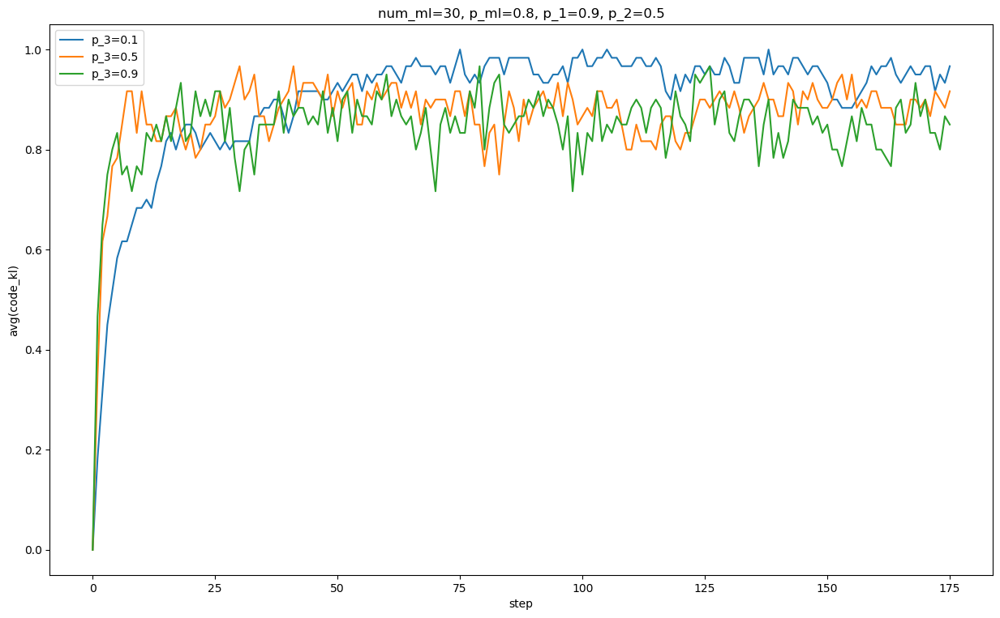

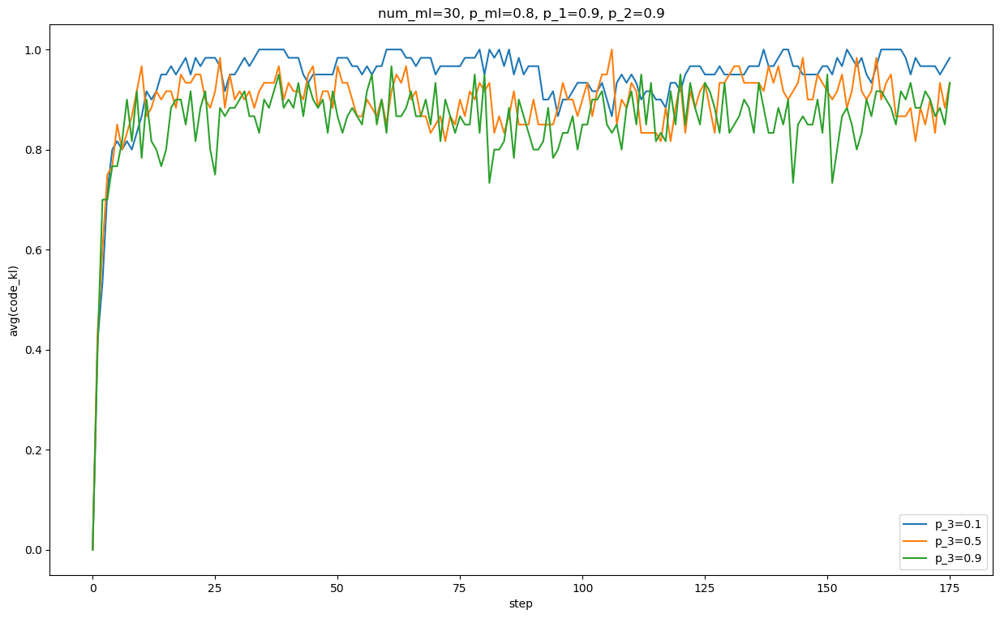

In [54]:
plot_time_series(ts, 'code_kl', fname='test2')

In [28]:
len(fnames)

81

In [ ]:


fig = plt.figure()
#plot sth

tmpfile = BytesIO()
fig.savefig(tmpfile, format='png')
encoded = base64.b64encode(tmpfile.getvalue()).decode('utf-8')

html = 'Some html head' + '<img src=\'data:image/png;base64,{}\'>'.format(encoded) + 'Some more html'

with open('test.html','w') as f:
    f.write(html)